In [1]:
import pickle

all_frames = pickle.load(open('/kaggle/input/unbc-mcmaster-shoulder-pain-dataset/image150.pkl', 'rb'))
all_labels = pickle.load(open('/kaggle/input/unbc-mcmaster-shoulder-pain-dataset/label150.pkl', 'rb'))
all_subjects = pickle.load(open('/kaggle/input/unbc-mcmaster-shoulder-pain-dataset/subject150.pkl', 'rb'))

In [2]:
len(all_frames)

5300

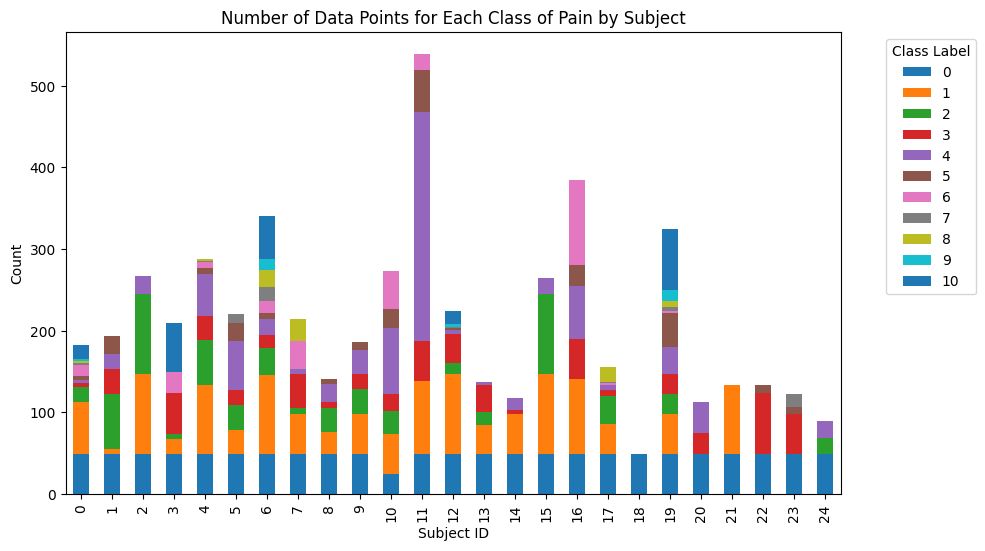

In [3]:
# analyse each subject contains how many types of classes
import pandas as pd
from matplotlib import pyplot as plt
# Sample DataFrame (replace this with your actual data)
data = {
    'Subject_ID': all_subjects,
    'Class_Label': all_labels,
}

df = pd.DataFrame(data)

# Group by Subject_ID and Class_Label, and count the number of occurrences
subject_class_counts = df.groupby(['Subject_ID', 'Class_Label']).size().reset_index(name='Count')

# Display the result
pivot_df = subject_class_counts.pivot(index='Subject_ID', columns='Class_Label', values='Count').fillna(0)

# Plot the bar chart
pivot_df.plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Number of Data Points for Each Class of Pain by Subject')
plt.xlabel('Subject ID')
plt.ylabel('Count')
plt.legend(title='Class Label', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

In [4]:
# Relabel the class to be more balance
new_class=[]
for n in range (len(all_labels)):
	temp = all_labels[n]
	if temp == 0: # No Pain
		new_class.append(int(0))
	elif temp == 1: # Mild Pain
		new_class.append(int(1))
	elif temp == 2 or temp == 3: # Moderate Pain
		new_class.append(int(2))
	elif temp == 4: # Very Pain
		new_class.append(int(3))
	else: # PSPI >= 5 : Severe Pain
		new_class.append(int(4))


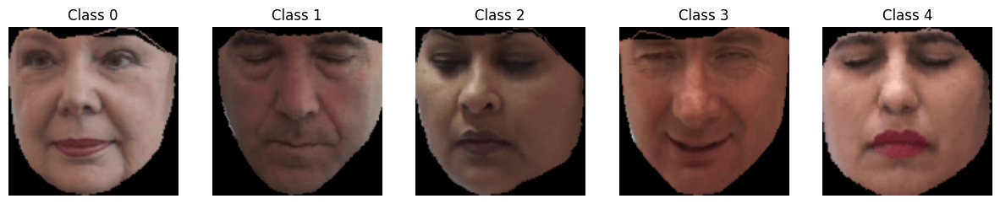

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Assuming you have a dataset X_train and y_train
# X_train: Features, y_train: Labels

# Find the indices of the first occurrence of each class
class_indices = [new_class.index(i, all_subjects.tolist().index(i+2)) for i in range(5)]

# Plot one example for each class
plt.figure(figsize=(15, 5))
for i, idx in enumerate(class_indices, 1):
    plt.subplot(1, 5, i)
    plt.imshow(cv2.cvtColor(all_frames[idx], cv2.COLOR_BGR2RGB))
    plt.title(f'Class {new_class[idx]}')
    plt.axis('off')

plt.show()

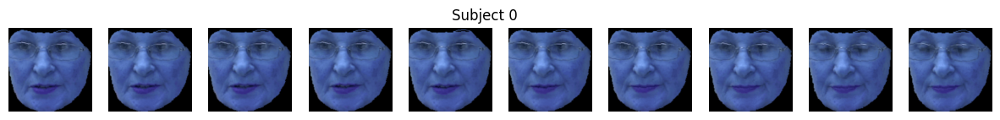

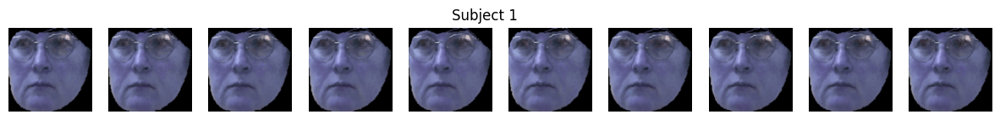

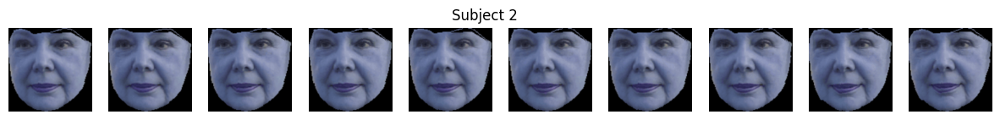

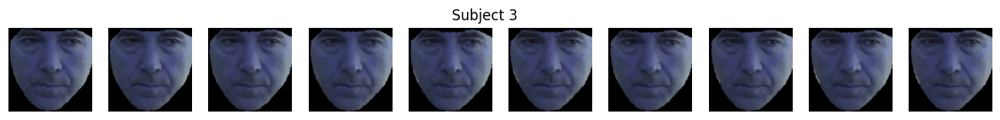

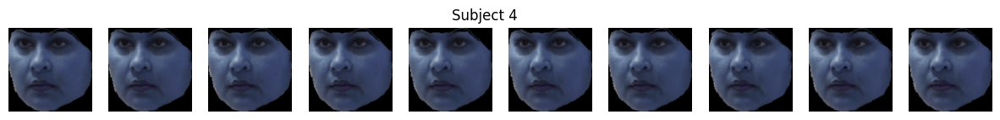

...

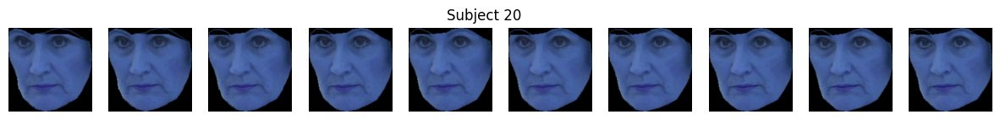

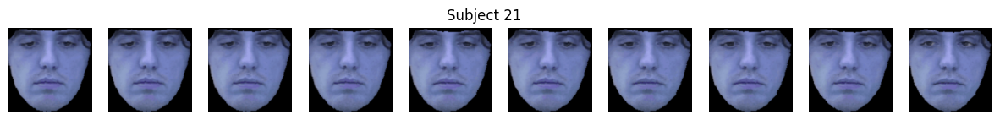

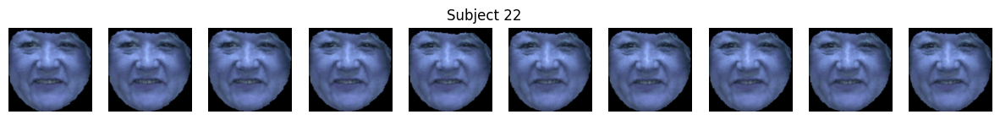

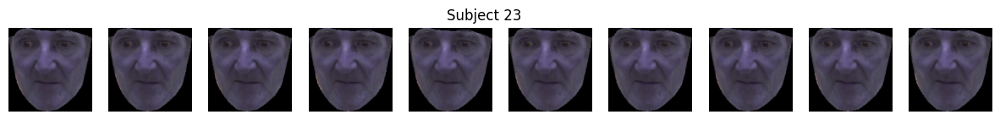

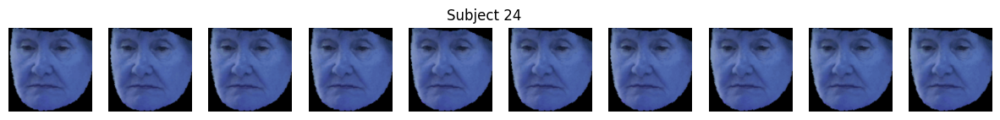

In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Number of photos to print for each subject
photos_per_subject = 10

# Dictionary to store selected images for each subject
selected_images = {}

# Iterate through the dataset and select 10 images for each subject
for img, label in zip(all_frames, all_subjects):
    if label not in selected_images:
        selected_images[label] = []
    if len(selected_images[label]) < photos_per_subject:
        selected_images[label].append(img)

# Display the selected images
for subject, images_list in selected_images.items():
    plt.figure(figsize=(15, 1.5))
    plt.suptitle(f"Subject {subject}")
    for i, img_path in enumerate(images_list, 1):
        # If images are stored as file paths
        if isinstance(img_path, str):
            image = cv2.imread(img_path)
        # If images are stored as NumPy arrays
        elif isinstance(img_path, np.ndarray):
            image = img_path
        else:
            raise ValueError("Unsupported image format")

        # Display the image
        plt.subplot(1, photos_per_subject, i)
        plt.imshow(image)
#         plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.axis("off")

    plt.show()

## Preprocess the image

In [7]:
gryscale_frames = [cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) for img in all_frames]

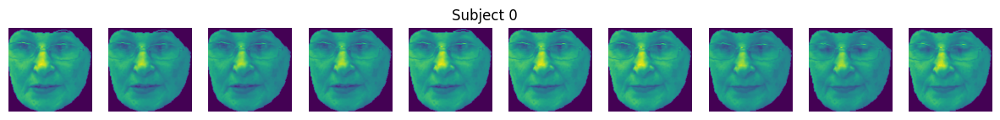

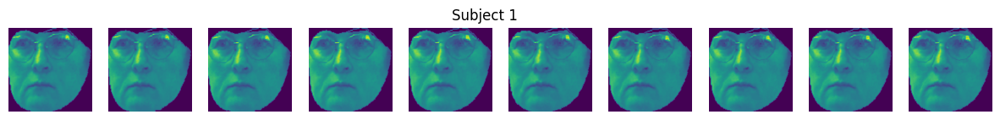

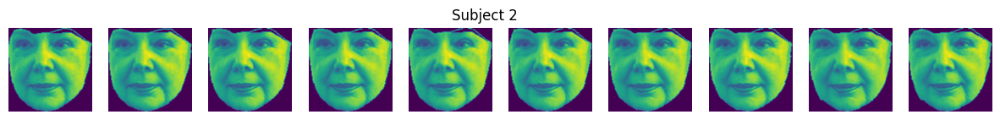

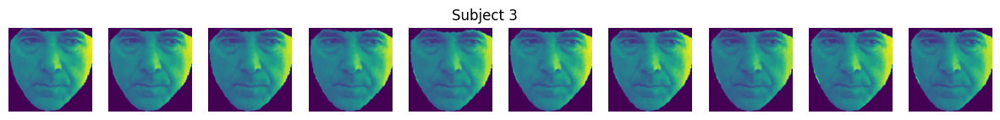

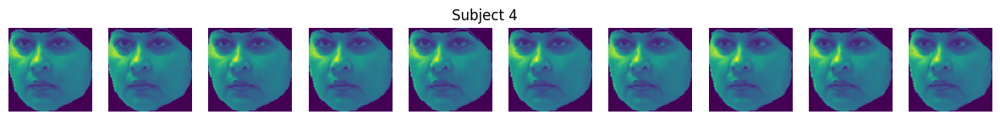

...

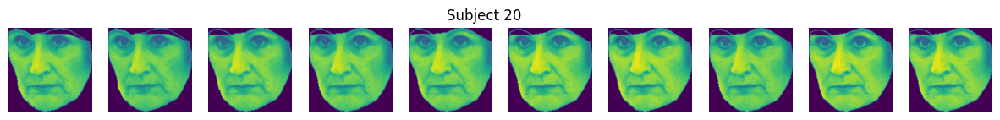

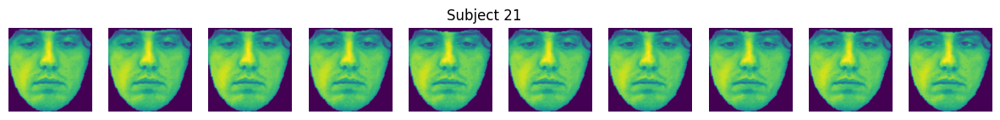

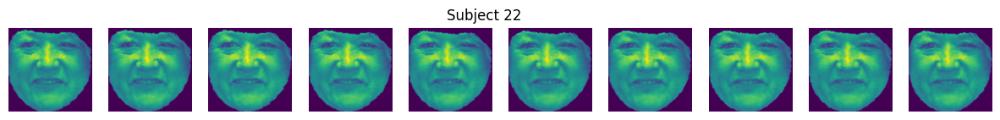

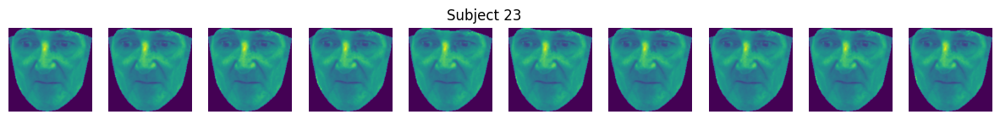

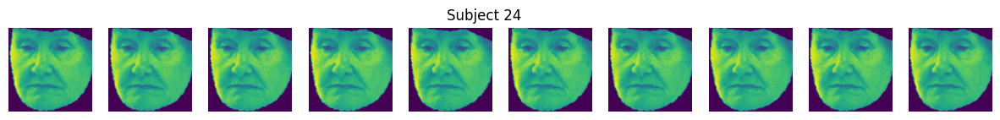

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Number of photos to print for each subject
photos_per_subject = 10

# Dictionary to store selected images for each subject
selected_images = {}

# Iterate through the dataset and select 10 images for each subject
for img, label in zip(gryscale_frames, all_subjects):
    if label not in selected_images:
        selected_images[label] = []
    if len(selected_images[label]) < photos_per_subject:
        selected_images[label].append(img)

# Display the selected images
for subject, images_list in selected_images.items():
    plt.figure(figsize=(15, 1.5))
    plt.suptitle(f"Subject {subject}")
    for i, img_path in enumerate(images_list, 1):
        # If images are stored as file paths
        if isinstance(img_path, str):
            image = cv2.imread(img_path)
        # If images are stored as NumPy arrays
        elif isinstance(img_path, np.ndarray):
            image = img_path
        else:
            raise ValueError("Unsupported image format")

        # Display the image
        plt.subplot(1, photos_per_subject, i)
        plt.imshow(image)
#         plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.axis("off")

    plt.show()

In [9]:
# Pick one subject data as the test set for the model 
# As subject index 0 has most number of classes labelled, therefore subject [0] is  the test set for the model 

# split into test and train-val set

temp_dataset = all_frames 

x_test = []
Y_test = []
subject_train_val = []
x_train_val = []
Y_train_val = []

for i in range(len(gryscale_frames)):
    if(all_subjects[i] == 0 or all_subjects[i] == 18 or all_subjects[i] == 22 
       or all_subjects[i] == 21 or all_subjects[i] == 24 or all_subjects[i] == 20):
        x_test.append(gryscale_frames[i])
        Y_test.append(new_class[i])
    else: 
        subject_train_val.append(all_subjects[i])
        x_train_val.append(gryscale_frames[i])
        Y_train_val.append(new_class[i])
        
print("Test set size =", len(x_test), "\nTrain-validation set size =", len(x_train_val))
print("Number of classes in test set:", len(set(Y_test)))
print("Number of classes in train_validation set: ", len(set(Y_train_val)))


Test set size = 700 
Train-validation set size = 4600
Number of classes in test set: 5
Number of classes in train_validation set:  5


In [10]:
import numpy as np

subject_train_val = np.array(subject_train_val)

x_test32 = np.array(x_test, dtype=np.float32)
x_train_val32 = np.array(x_train_val, dtype=np.float32)

Y_test16 = np.array(Y_test, dtype=np.int16)
Y_train_val16 = np.array(Y_train_val, dtype=np.int16)

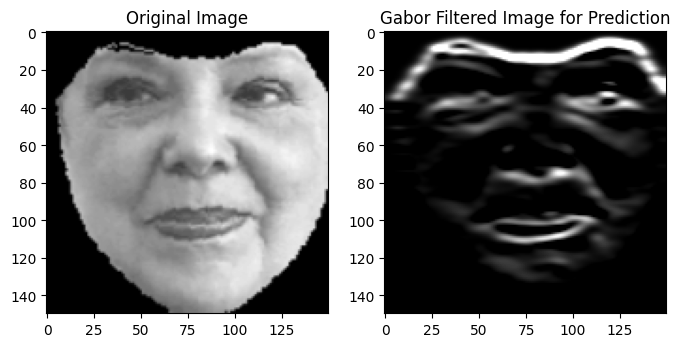

In [11]:
# Normalize the frames
# x_test1 = x_test32 / 255.0
# x_train_val1 = x_train_val32 / 255.0

# Define Gabor filter parameters
ksize = 31  # Kernel size
sigma = 1.5  # Standard deviation of the Gaussian envelope
theta = np.pi / 2 # Orientation of the Gabor filter np.pi / 4
lambd = 20# Wavelength of the sinusoidal factor
gamma = 0.5 # Spatial aspect ratio

# Create Gabor kernel
gabor_kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lambd, gamma)
x_train_val1 = [cv2.filter2D(input_image, cv2.CV_8U, gabor_kernel) for input_image in x_train_val32]
x_test1 = [cv2.filter2D(input_image, cv2.CV_8U, gabor_kernel) for input_image in x_test32]

# Display the original and Gabor-filtered images
plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)
plt.imshow(x_train_val32[300], cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(x_train_val1[300], cmap='gray')
plt.title('Gabor Filtered Image for Prediction')

plt.show()

x_test1 = (np.array(x_test1,dtype=np.float32))/255
x_train_val1 =( np.array(x_train_val1,dtype=np.float32))/255

In [12]:
import numpy as np
from tensorflow import keras
from matplotlib import pyplot as plt
from IPython.display import clear_output

class PlotLearning(keras.callbacks.Callback):
    """
    Callback to plot the learning curves of the model during training.
    """
    def on_train_begin(self, logs={}):
        self.metrics = {}
        for metric in logs:
            self.metrics[metric] = []


    def on_epoch_end(self, epoch, logs={}):
        # Storing metrics
        for metric in logs:
            if metric in self.metrics:
                self.metrics[metric].append(logs.get(metric))
            else:
                self.metrics[metric] = [logs.get(metric)]

        # Plotting
        metrics = [x for x in logs if 'val' not in x]

        f, axs = plt.subplots(1, len(metrics), figsize=(15,5))
        clear_output(wait=True)

        for i, metric in enumerate(metrics):
            axs[i].plot(range(1, epoch + 2),
                        self.metrics[metric],
                        label=metric)
            if logs['val_' + metric]:
                axs[i].plot(range(1, epoch + 2),
                            self.metrics['val_' + metric],
                            label='val_' + metric)

            axs[i].legend()
            axs[i].grid()

        plt.tight_layout()
        plt.show()

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [13]:
# import tensorflow as tf
# from sklearn.metrics import f1_score

# class F1Score(tf.keras.metrics.Metric):
#     def __init__(self, num_classes=5, name='f1_score', **kwargs):
#         super(F1Score, self).__init__(name=name, **kwargs)
#         self.num_classes = num_classes
#         self.true_positives = [self.add_weight(name=f'true_positives_{i}', initializer='zeros') for i in range(num_classes)]
#         self.false_positives = [self.add_weight(name=f'false_positives_{i}', initializer='zeros') for i in range(num_classes)]
#         self.false_negatives = [self.add_weight(name=f'false_negatives_{i}', initializer='zeros') for i in range(num_classes)]

#     def update_state(self, y_true, y_pred, sample_weight=None):
#         y_true = tf.math.argmax(y_true, axis=1)
#         y_pred = tf.math.argmax(y_pred, axis=1)
        
#         for class_idx in range(self.num_classes):
#             true_positives = tf.reduce_sum(tf.cast(tf.logical_and(tf.equal(y_true, class_idx), tf.equal(y_pred, class_idx)), tf.float32))
#             false_positives = tf.reduce_sum(tf.cast(tf.logical_and(tf.equal(y_true, class_idx), tf.not_equal(y_pred, class_idx)), tf.float32))
#             false_negatives = tf.reduce_sum(tf.cast(tf.logical_and(tf.not_equal(y_true, class_idx), tf.equal(y_pred, class_idx)), tf.float32))

#             self.true_positives[class_idx].assign_add(true_positives)
#             self.false_positives[class_idx].assign_add(false_positives)
#             self.false_negatives[class_idx].assign_add(false_negatives)

#     def result(self):
#         precision = [tp / (tp + fp + tf.keras.backend.epsilon()) for tp, fp in zip(self.true_positives, self.false_positives)]
#         recall = [tp / (tp + fn + tf.keras.backend.epsilon()) for tp, fn in zip(self.true_positives, self.false_negatives)]
#         f1 = [2 * (p * r) / (p + r + tf.keras.backend.epsilon()) for p, r in zip(precision, recall)]
#         return tf.reduce_mean(f1)

#     def reset_state(self):
#         for i in range(self.num_classes):
#             self.true_positives[i].assign(tf.zeros_like(self.true_positives[i]))
#             self.false_positives[i].assign(tf.zeros_like(self.false_positives[i]))
#             self.false_negatives[i].assign(tf.zeros_like(self.false_negatives[i]))


In [14]:
from keras import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, AveragePooling2D, SpatialDropout2D
from keras.regularizers import l1_l2
import tensorflow as tf

def PainScorePredictor(dropout_rate=0.5, l1=0.08, l2=0.07):
    model = Sequential()

    model.add(Conv2D(8, (5,5), strides=(1,1), padding='same',activation='relu', input_shape=(150, 150, 1),
                    kernel_regularizer=tf.keras.regularizers.l1_l2(l1=l1, l2=l2)))
    model.add(MaxPooling2D((3,3), strides=(2, 2)))
    model.add(SpatialDropout2D(0.7))

    model.add(Conv2D(16, (3, 3), strides=(1, 1), padding='same', activation='relu',
                     kernel_regularizer=tf.keras.regularizers.l1_l2(l1=l1, l2=l2)))
    model.add(MaxPooling2D((2, 2), strides=(2, 2)))
    model.add(SpatialDropout2D(0.7))

#     model.add(Conv2D(32, (5, 5), strides=(1, 1), padding='same', activation='relu'
#                      ,kernel_regularizer=tf.keras.regularizers.l1_l2(l1=l1, l2=l2)))
# #     model.add(SpatialDropout2D(dropout_rate))
#     model.add(MaxPooling2D((2, 2), strides=(2, 2)))

    model.add(Flatten())
#     model.add(Dense(16, activation='relu')) #64
    model.add(Dropout(dropout_rate))
    model.add(Dense(5, activation='softmax'))

    return model
model = PainScorePredictor()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 8)       208       
                                                                 
 max_pooling2d (MaxPooling2  (None, 74, 74, 8)         0         
 D)                                                              
                                                                 
 spatial_dropout2d (Spatial  (None, 74, 74, 8)         0         
 Dropout2D)                                                      
                                                                 
 conv2d_1 (Conv2D)           (None, 74, 74, 16)        1168      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 37, 37, 16)        0         
 g2D)                                                            
                                                        

In [23]:
# train by using pretrained model
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Flatten, Dropout
from keras.applications import VGG16,EfficientNetB0
from keras.optimizers import Adam

def initialise_model():
    base_model = EfficientNetB0(weights='imagenet', include_top=False)

    model = Sequential()
    model.add(base_model)
    model.add(Flatten())
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(10, activation='softmax'))

    for layer in base_model.layers:
        layer.trainable = False
        
    return model

In [ ]:
import tensorflow as tf
from sklearn.model_selection import StratifiedGroupKFold, GroupKFold
from sklearn.utils.class_weight import compute_class_weight
from keras.callbacks import EarlyStopping
from keras.optimizers.schedules import ExponentialDecay
from keras import metrics
from sklearn.metrics import f1_score

seed_value = 50
tf.random.set_seed(seed_value)
np.random.seed(seed_value)
n_fold = len(set(subject_train_val))
print("Number of fold:", n_fold)
# Assuming your data is loaded into X and y
# X: Features, y: Labels
X = x_train_val1
y = tf.keras.utils.to_categorical(Y_train_val16, 5)

all_model = [initialise_model() for n in range(n_fold)]

# Set up k-fold cross-validation
gkf = GroupKFold(n_splits=n_fold)
sgkf = StratifiedGroupKFold(n_splits=n_fold, random_state=seed_value,shuffle=True)

hist = []

# Training loop with k-fold cross-validation
for fold, (train_idx, val_idx) in enumerate(sgkf.split(X, Y_train_val16, groups=subject_train_val)):
    X_train, y_train = X[train_idx], y[train_idx]
    X_val, y_val = X[val_idx], y[val_idx]
    print("Current fold:", (fold+1))
#     if not fold == 9 and not fold ==10 and not fold == 13:
#         continue
    class_weights = compute_class_weight('balanced', classes=np.unique(Y_train_val16), y=Y_train_val16[train_idx])
    class_weight_dict = dict(zip(np.unique(Y_train_val16), class_weights))
    
#     print("Class Weight:", class_weight_dict)
#     print("Training size:",len(train_idx), "Validation Size:", len(val_idx))
    
    # Compile and fit the model
    X_train = tf.convert_to_tensor(X_train)
    y_train = tf.convert_to_tensor(y_train)
    
    train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
    train_dataset = train_dataset.shuffle(buffer_size=len(X_train),reshuffle_each_iteration=True).batch(80)
    
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=10000,
    decay_rate=0.9)
    
    # tf.keras.metrics.F1Score(average=None, threshold=None, name='f1_score', dtype=None)]
    optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)  
    all_model[fold].compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=[tf.keras.metrics.F1Score(
    average='weighted', threshold=0.4, name='f1_score', dtype=None)])
    
    early_stopping = EarlyStopping(monitor='val_loss', patience=10)
    plot_learning = PlotLearning()

#     class_weight=class_weight_dict,
    hist.append(all_model[fold].fit(train_dataset, class_weight=class_weight_dict,epochs=50, batch_size=100,shuffle=True,
                          validation_data=(X_val, y_val),callbacks=[early_stopping,plot_learning]))
    
#     hist.append(all_model[fold].fit_generator(datagen.flow(X_train, y_train, batch_size=50),
#                                     class_weight=class_weight_dict,
#                                     steps_per_epoch= len(X_train) / 50,
#                                     epochs=40,
#                                     validation_data=(X_val, y_val),
#                                     callbacks=[early_stopping, PlotLearning()]))

#     model.save(f'model_fold_{fold}.keras')

Number of fold: 19


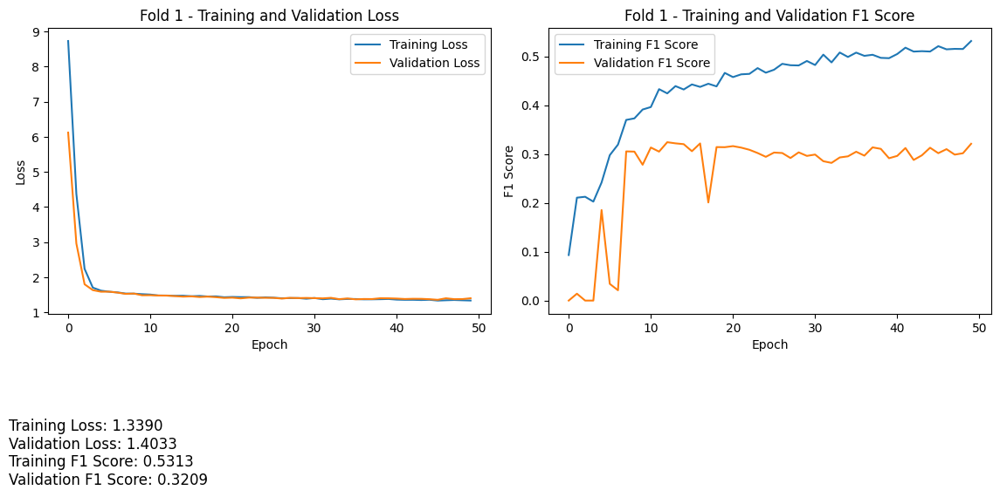

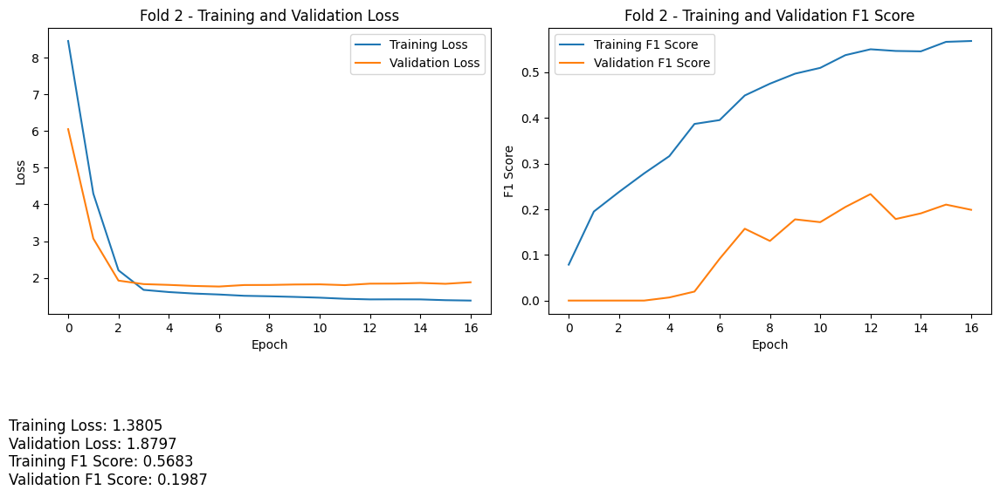

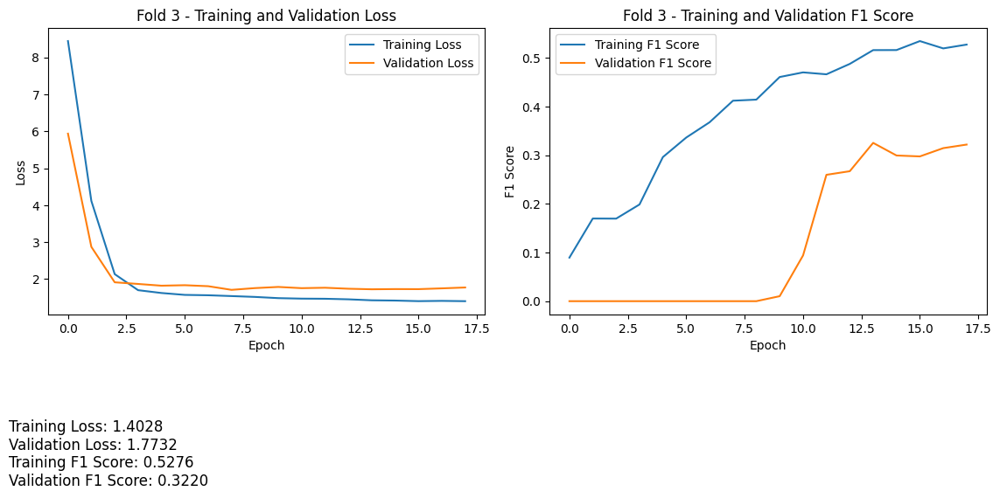

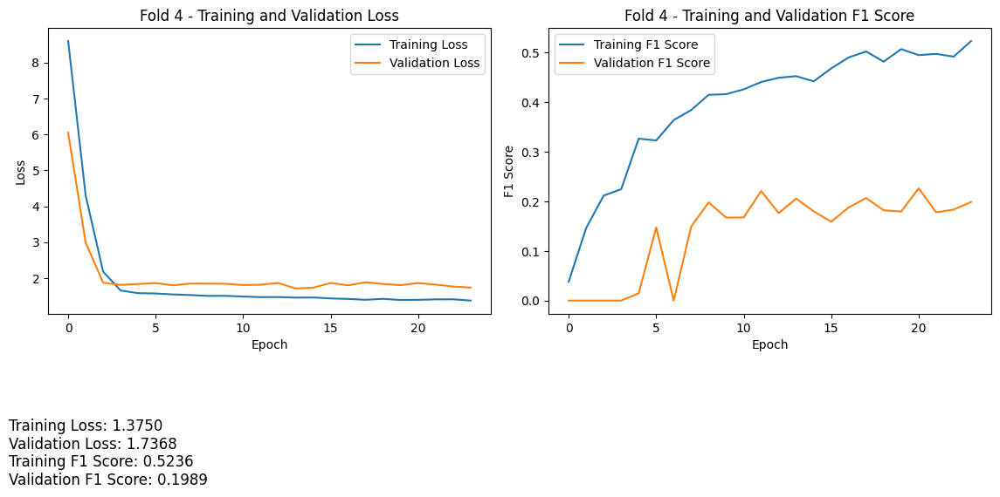

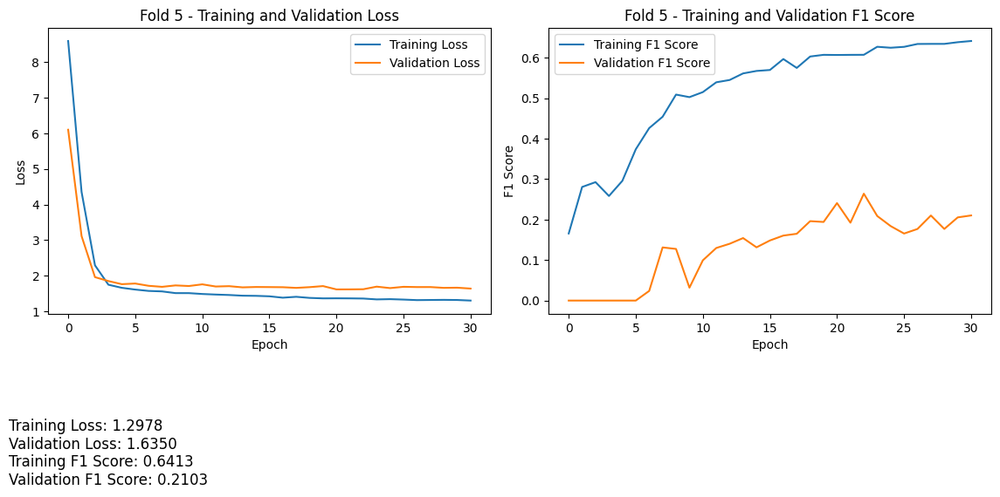

...

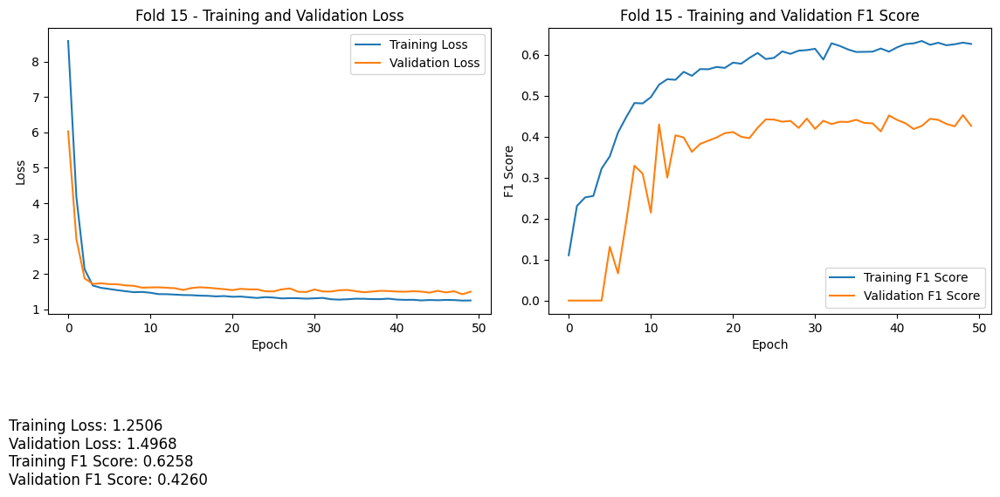

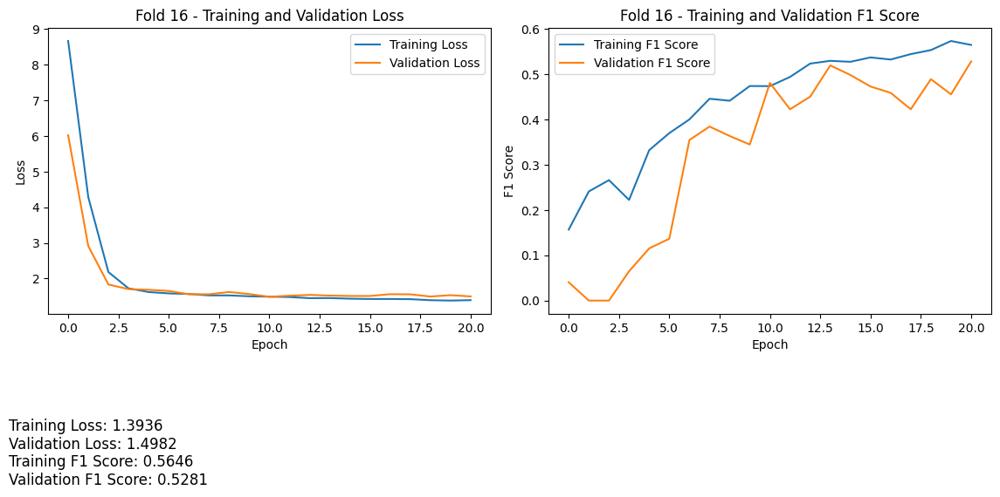

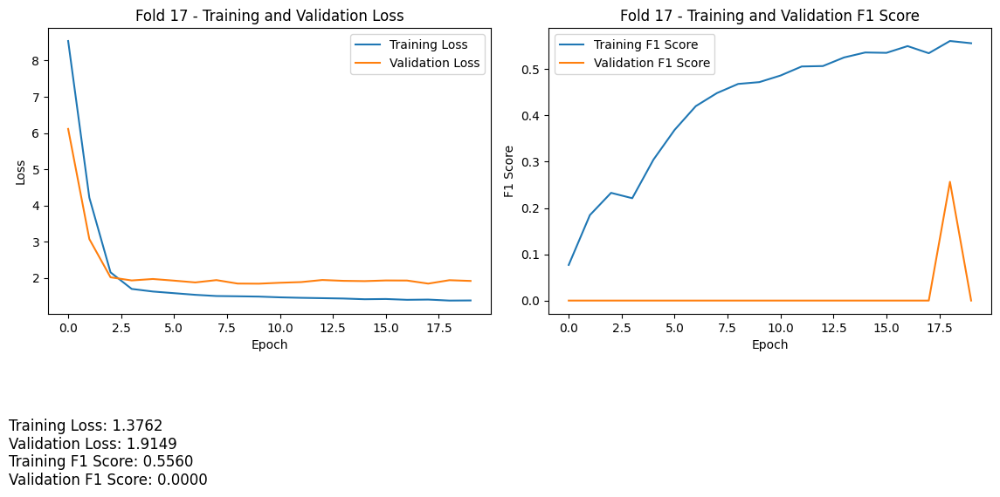

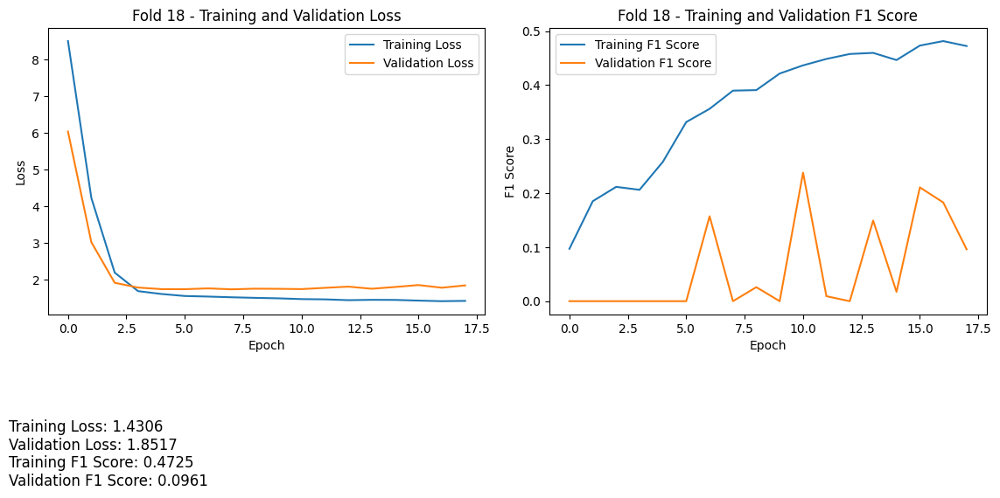

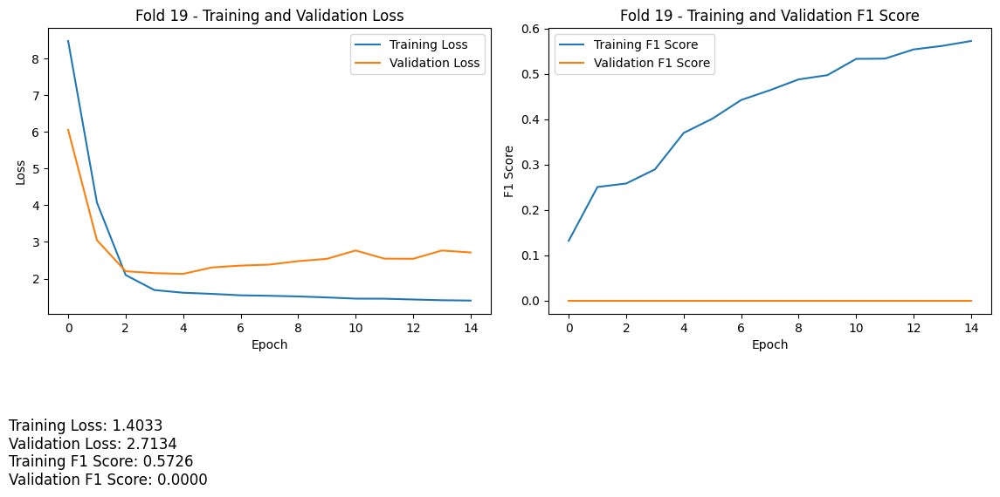

In [54]:
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
import os 

if not os.path.exists("/kaggle/working/loss_graph"):
    os.mkdir("/kaggle/working/loss_graph")
    
for n in range (0, len(hist)):
    temp = hist[n]

    # Plot training-validation loss
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(temp.history['loss'], label='Training Loss')
    plt.plot(temp.history['val_loss'], label='Validation Loss')
    plt.title(f'Fold {n + 1} - Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.text(0.05, -0.05,
                 f'Training Loss: {temp.history["loss"][-1]:.4f}\n'
                 f'Validation Loss: {temp.history["val_loss"][-1]:.4f}\n'
                 f'Training F1 Score: {temp.history["f1_score"][-1]:.4f}\n'
                 f'Validation F1 Score: {temp.history["val_f1_score"][-1]:.4f}',
                 transform=plt.gcf().transFigure, fontsize=12,
                 verticalalignment='center', horizontalalignment='left')
    
    # Plot F1 score for training and validation
    plt.subplot(1, 2, 2)
    plt.plot(temp.history['f1_score'], label='Training F1 Score')
    plt.plot(temp.history['val_f1_score'], label='Validation F1 Score')
    plt.title(f'Fold {n + 1} - Training and Validation F1 Score')
    plt.xlabel('Epoch')
    plt.ylabel('F1 Score')
    plt.legend()        
    plt.tight_layout()
    plt.savefig('/kaggle/working/loss_graph/Loss Across Fold_'+ str(n+1)+ '.png',bbox_inches='tight')
    plt.show()





22/22 [==============================] - 0s 3ms/step


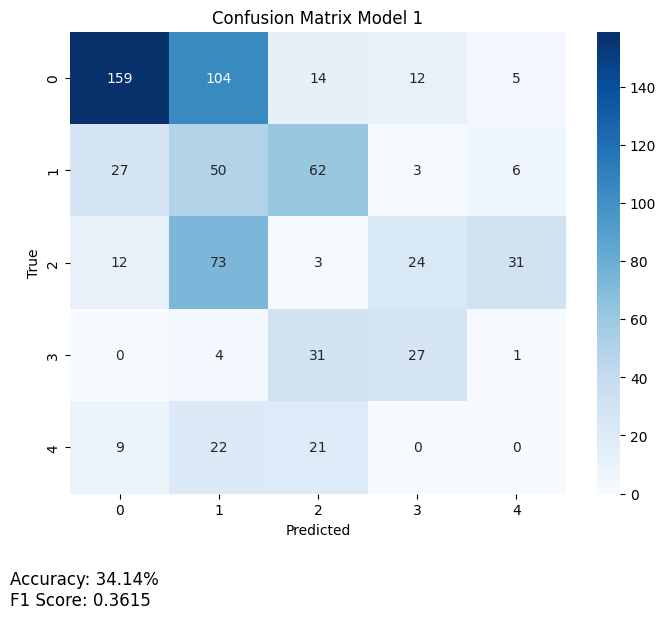

22/22 [==============================] - 0s 3ms/step


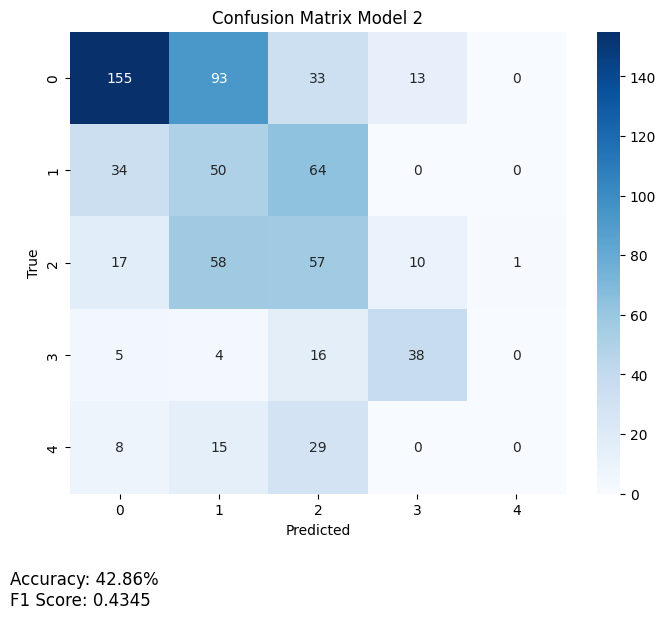

22/22 [==============================] - 0s 3ms/step


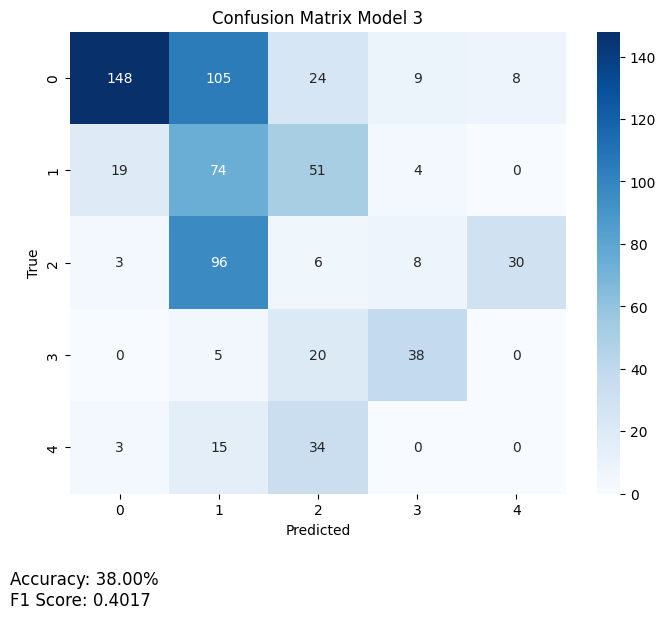

22/22 [==============================] - 0s 3ms/step


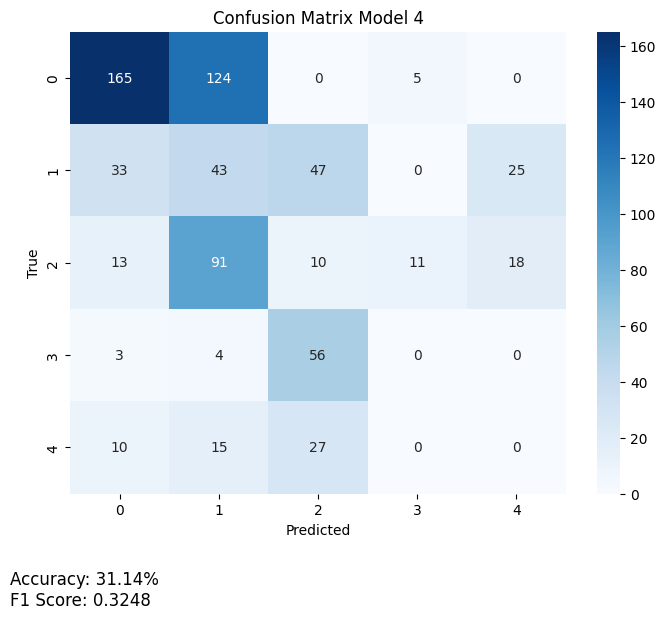

22/22 [==============================] - 0s 3ms/step


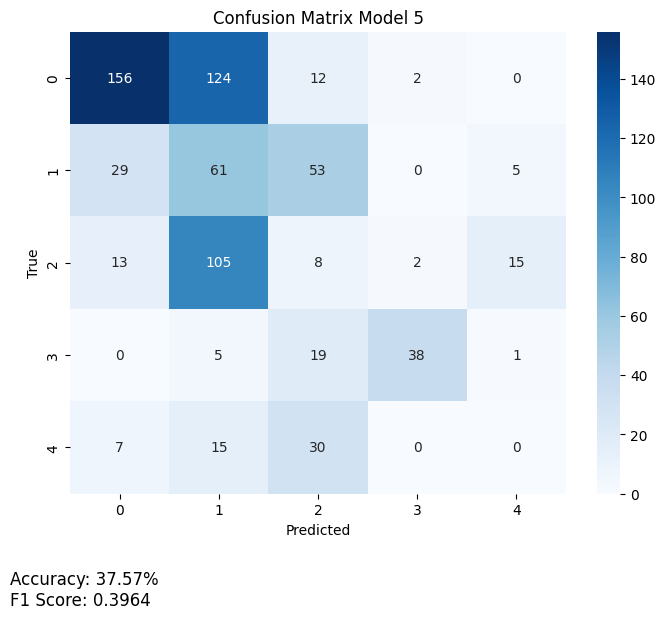

22/22 [==============================] - 0s 3ms/step


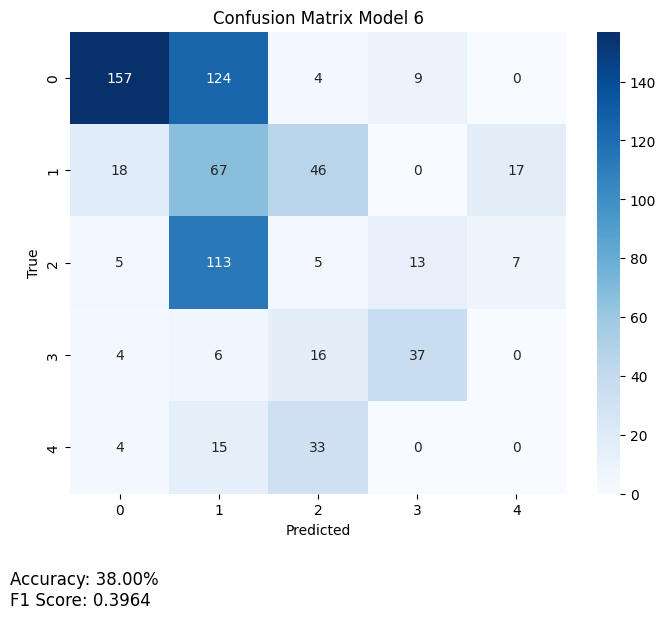

22/22 [==============================] - 0s 4ms/step


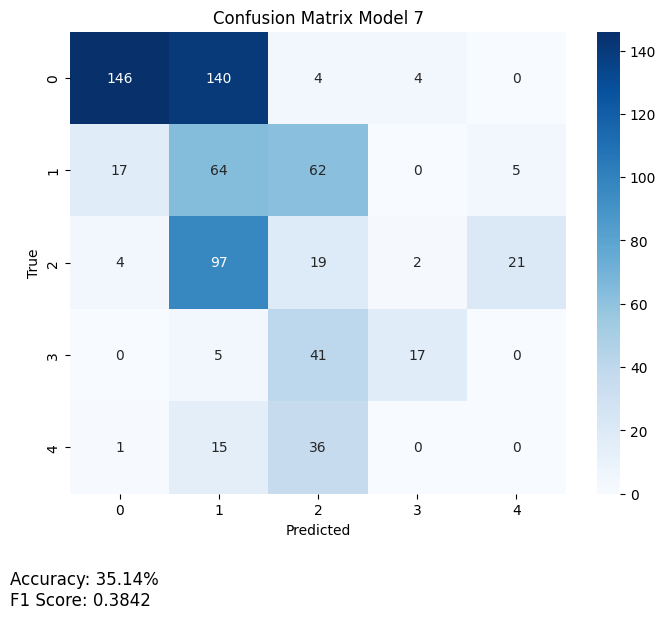

22/22 [==============================] - 0s 3ms/step


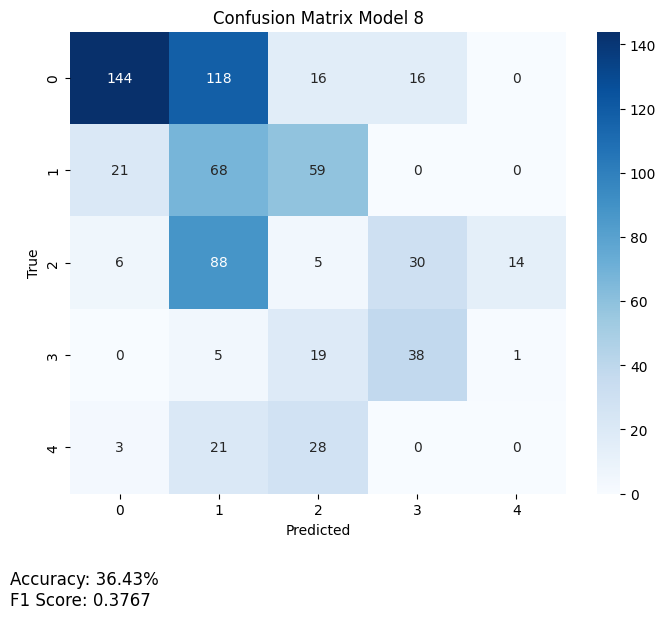

22/22 [==============================] - 0s 3ms/step


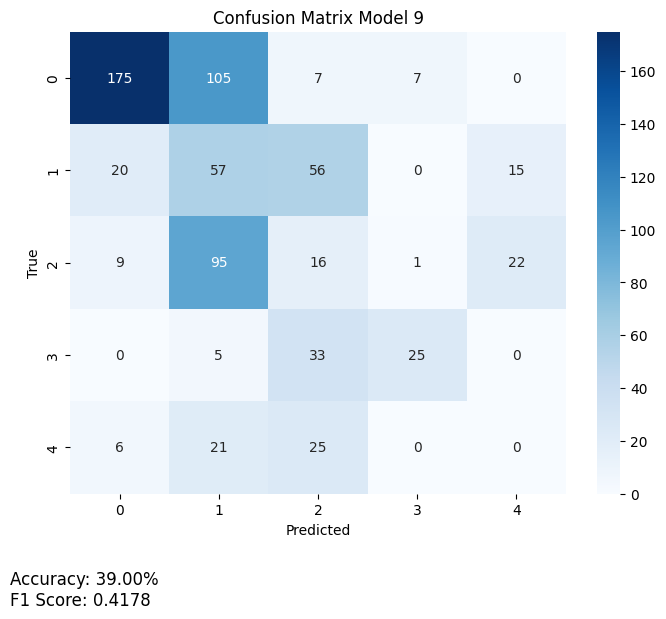

22/22 [==============================] - 0s 3ms/step


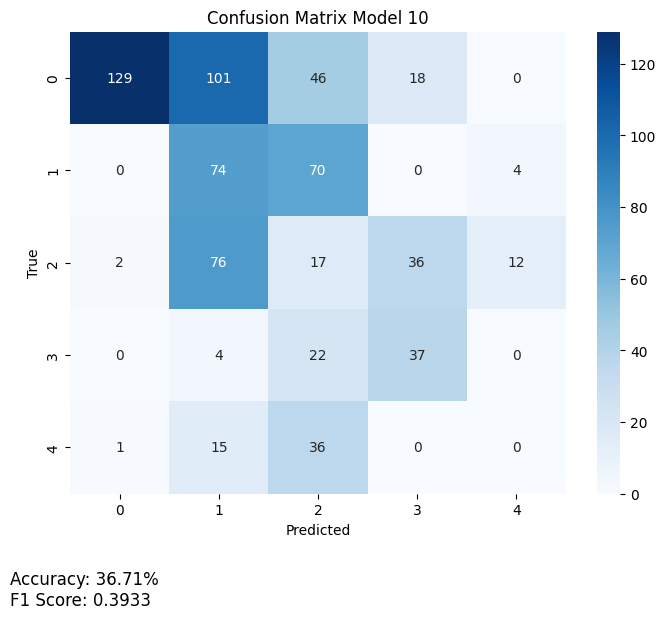

22/22 [==============================] - 0s 3ms/step


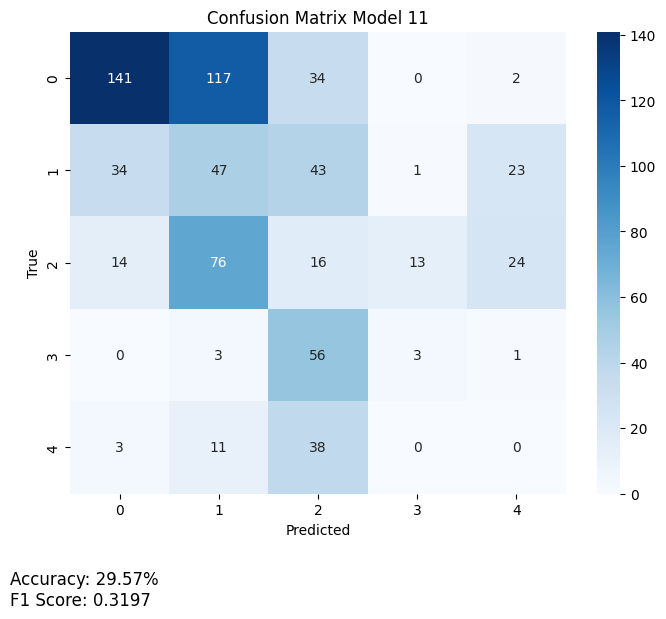

22/22 [==============================] - 0s 3ms/step


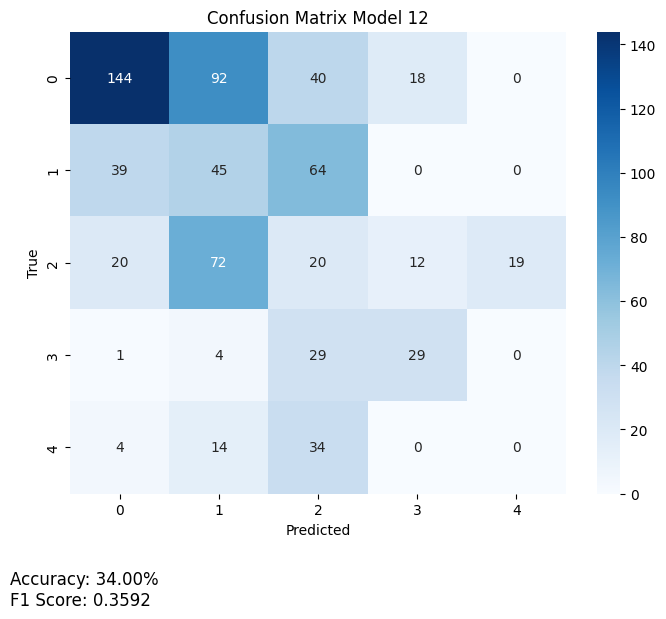

22/22 [==============================] - 0s 3ms/step


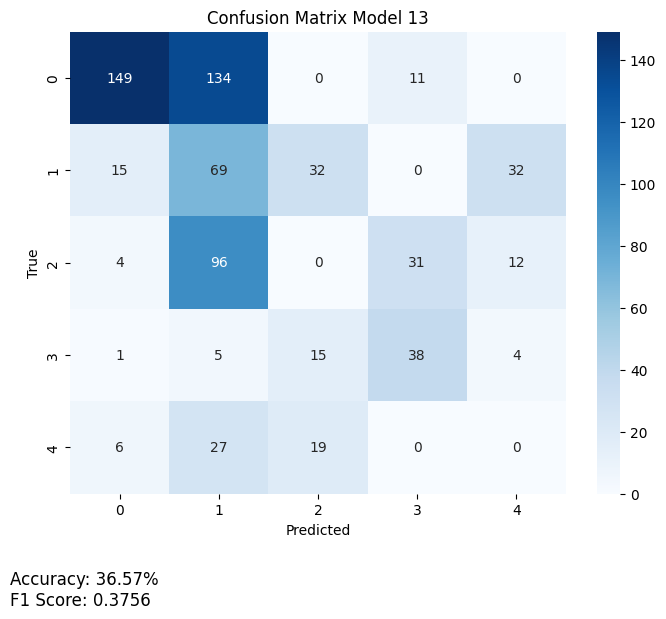

22/22 [==============================] - 0s 4ms/step


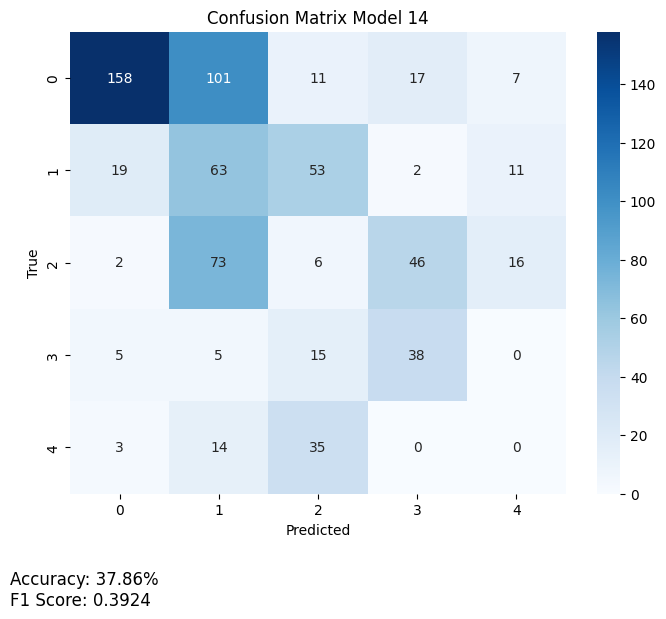

22/22 [==============================] - 0s 3ms/step


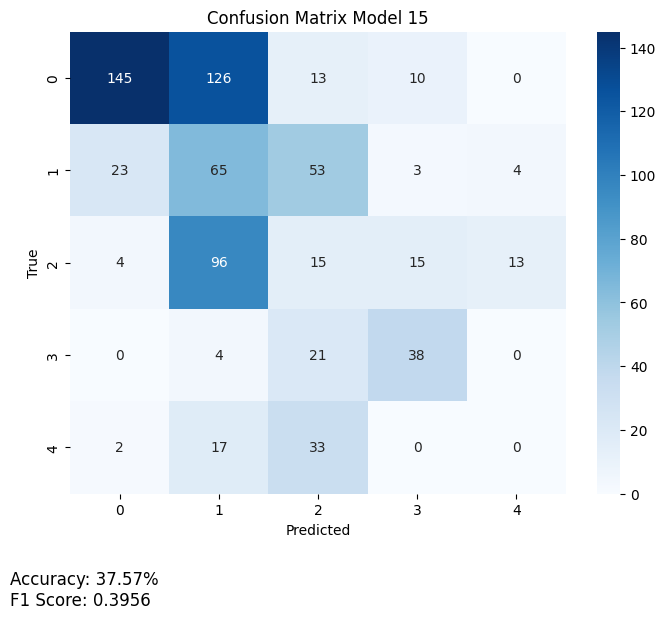

22/22 [==============================] - 0s 3ms/step


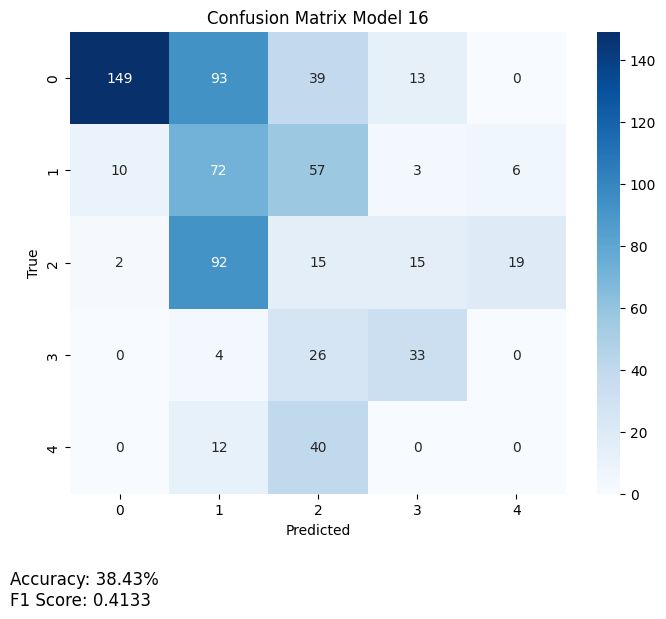

22/22 [==============================] - 0s 3ms/step


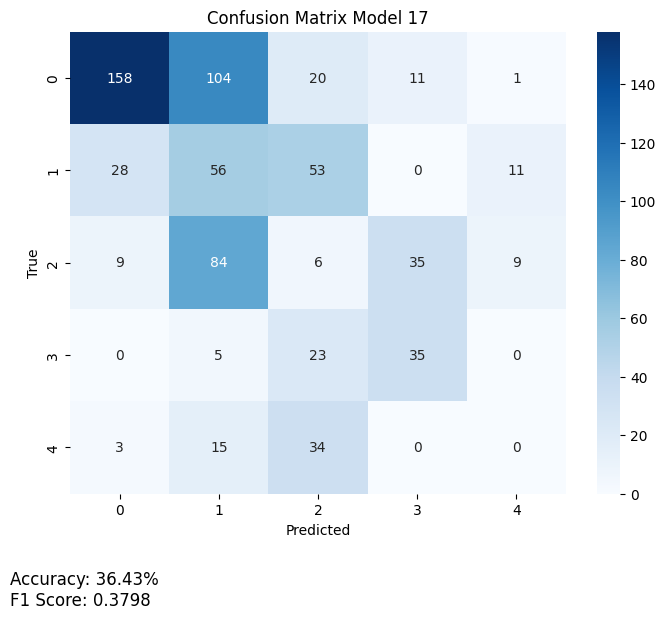

22/22 [==============================] - 0s 3ms/step


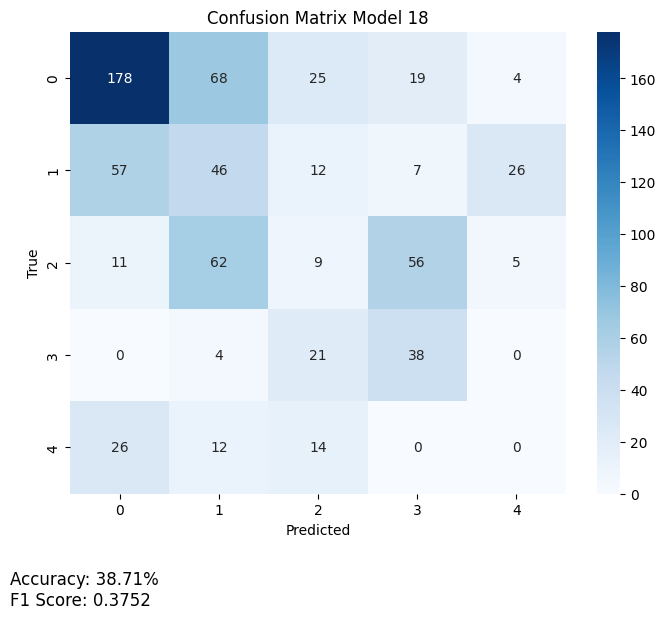

22/22 [==============================] - 0s 3ms/step


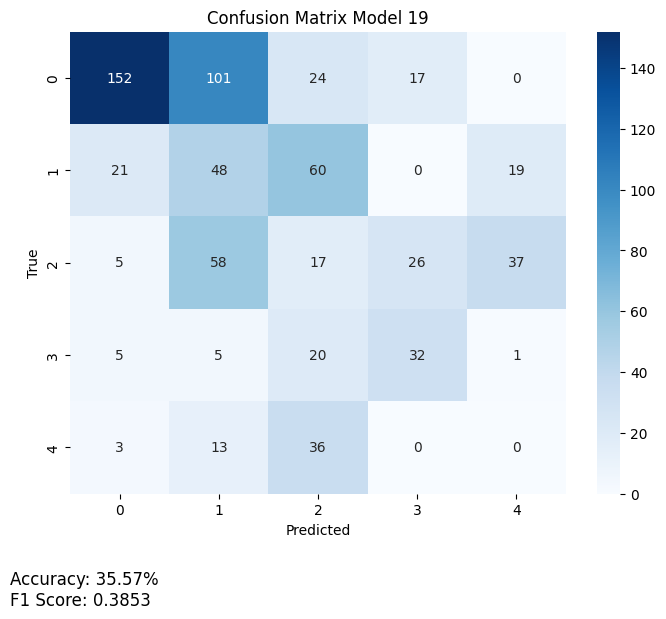

In [55]:
from sklearn.metrics import accuracy_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import os


if not os.path.exists("/kaggle/working/confusion_matrix"):
    os.mkdir("/kaggle/working/confusion_matrix")

for i in range(len(hist)):
    y_pred = all_model[i].predict(x_test1)

    predicted_classes = tf.argmax(y_pred, axis=1)
    # Assuming you have computed predicted_classes and y_test_subject
    accuracy = accuracy_score(Y_test16, predicted_classes)
    f1 = f1_score(Y_test16, predicted_classes, average='weighted')
    cm = confusion_matrix(Y_test16, predicted_classes)

    # Get the class labels
    class_labels = np.unique(Y_test16)

    # Plot the confusion matrix as a heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.title(f'Confusion Matrix Model {i+1}')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.text(0.05, -0.05,
            f'Accuracy: {accuracy * 100:.2f}%\n'
            f'F1 Score: {f1:.4f}',
            transform=plt.gcf().transFigure, fontsize=12,
            verticalalignment='center', horizontalalignment='left')
    
    plt.savefig('/kaggle/working/confusion_matrix/CM Fold_'+ str(i+1)+ '.png',bbox_inches='tight')
    plt.show()

In [56]:
import os 
path = "/kaggle/working/model"
if not (os.path.exists(path)):
    os.mkdir(path)
for i in range(len(all_model)):
    all_model[i].save(f'{path}/model_fold_{i+1}.h5')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [57]:
from datetime import datetime
import pytz
from pytz import timezone

now_utc = datetime.now(timezone('UTC'))

# Converting to Asia/Kolkata time zone
now_asia = now_utc.astimezone(timezone('Asia/Kuala_Lumpur'))


# dd/mm/YY H:M:S
dt_string = now_asia.strftime("%d-%m-%Y_%H-%M-%S")
print("date and time =", dt_string)

date and time = 12-01-2024_20-09-00


In [58]:
!zip -r history_{dt_string}.zip /kaggle/working/*

  adding: kaggle/working/confusion_matrix/ (stored 0%)
  adding: kaggle/working/confusion_matrix/CM Fold_9.png (deflated 14%)
  adding: kaggle/working/confusion_matrix/CM Fold_10.png (deflated 14%)
  adding: kaggle/working/confusion_matrix/CM Fold_6.png (deflated 14%)
  adding: kaggle/working/confusion_matrix/CM Fold_15.png (deflated 14%)
  adding: kaggle/working/confusion_matrix/CM Fold_11.png (deflated 14%)
  adding: kaggle/working/confusion_matrix/CM Fold_8.png (deflated 14%)
  adding: kaggle/working/confusion_matrix/CM Fold_18.png (deflated 14%)
  adding: kaggle/working/confusion_matrix/CM Fold_3.png (deflated 14%)
  adding: kaggle/working/confusion_matrix/CM Fold_13.png (deflated 14%)
  adding: kaggle/working/confusion_matrix/CM Fold_14.png (deflated 14%)
  adding: kaggle/working/confusion_matrix/CM Fold_4.png (deflated 14%)
  adding: kaggle/working/confusion_matrix/CM Fold_19.png (deflated 14%)
  adding: kaggle/working/confusion_matrix/CM Fold_5.png (deflated 14%)
  adding: kaggl

In [59]:
%cd /kaggle/working
from IPython.display import FileLink

FileLink(r'history_'+dt_string+'.zip')
# FileLink(r'allModel.zip')


/kaggle/working


/kaggle/working/history_12-01-2024_20-09-00.zip

In [53]:
!rm -rf /kaggle/working/*